In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from matplotlib.gridspec import GridSpec

sns.set_context('talk')
sns.set_style("whitegrid")
sns.set_palette("colorblind")

mpl.rcParams['font.size'] = 18.0
mpl.rcParams['xtick.labelsize'] = 18.0
mpl.rcParams['ytick.labelsize'] = 18.0
mpl.rcParams['axes.labelsize'] = 18.0
mpl.rcParams['axes.labelsize'] = 18.0

import copy
from hendrics.fake import filter_for_deadtime
from stingray import Powerspectrum, Crossspectrum, AveragedPowerspectrum, AveragedCrossspectrum

from astropy.modeling.models import Lorentz1D, Const1D
import numpy as np


## What about different fluxes?

In the file `simulations.py` we put all the code needed to simulate light curves with a given power spectrum, fit their periodograms, etc

In [2]:
from simulations import *

<IPython.core.display.Javascript object>


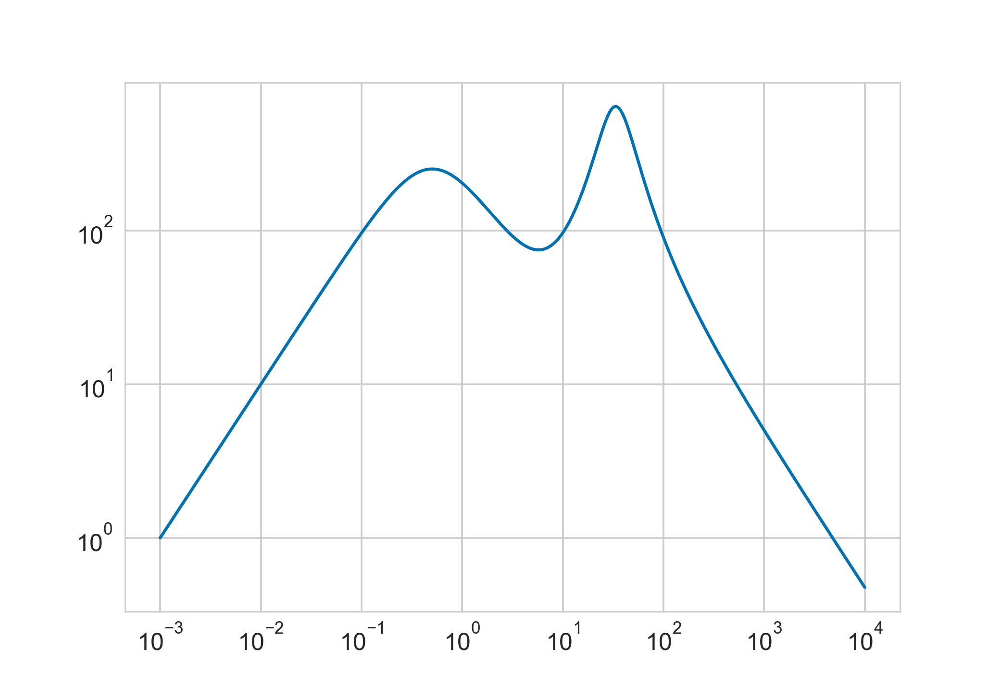

In [3]:
model = Lorentz1D(x_0=0, fwhm=1, amplitude=1000) + \
        Lorentz1D(x_0=30, fwhm=30, amplitude=20)

freqs = np.logspace(-3, 4, 1000)
plt.figure()
plt.loglog(freqs, model(freqs) * freqs)

For example, we can simulate a lightcurve containing this model power spectrum, with a given length, rms, count rate, then calculate the various periodograms, apply FAD normalization, and plot it with a given normalization (e.g. 'Leahy', 'frac')

Here we are using the model above to create a light curve 256-s long, with 50% rms and 1000 counts count rate, and calculate the cospectra over chunks of 128 seconds. Then, we plot a rebinned version (rebinned to a frequency resolution of 1.) for clarity.

We can see how in Leahy normalization the white noise level of the FAD-corrected periodograms go comfortably to 2.!

<IPython.core.display.Javascript object>


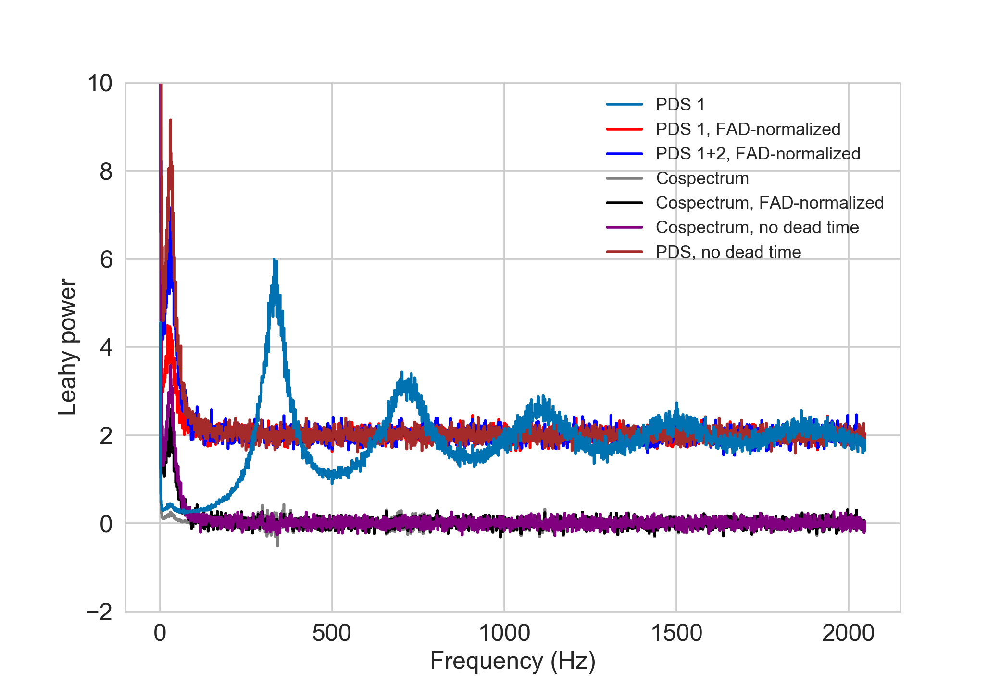

In [6]:
label, fad_delta = \
    simulate_spectrum(model, tstop=256, segment_size=128, 
                      smoothing_alg='gauss', rms=0.5, mean_ctrate=1000,
                      norm='leahy')
fig = plot_spectrum(label, rebin_factor=1., xlim=None, ylim=[-2, 10], show=True, subtract_mean=False)

Same, using four Lorenzian features with total rms 40%, count rate 400 ct/s, normalized with fractional rms

In [7]:
rms=0.4
ctrate=400
model_highfreq = Lorentz1D(x_0=50, fwhm=40, amplitude=20) + Lorentz1D(x_0=200, fwhm=40, amplitude=20) + Lorentz1D(x_0=300, fwhm=40, amplitude=20) + Lorentz1D(x_0=400, fwhm=40, amplitude=20)
label, fad_delta = \
    simulate_spectrum(model_highfreq, tstop=4096, segment_size=128, 
                      smoothing_alg='gauss', rms=rms, mean_ctrate=ctrate,
                      norm='frac')

<IPython.core.display.Javascript object>


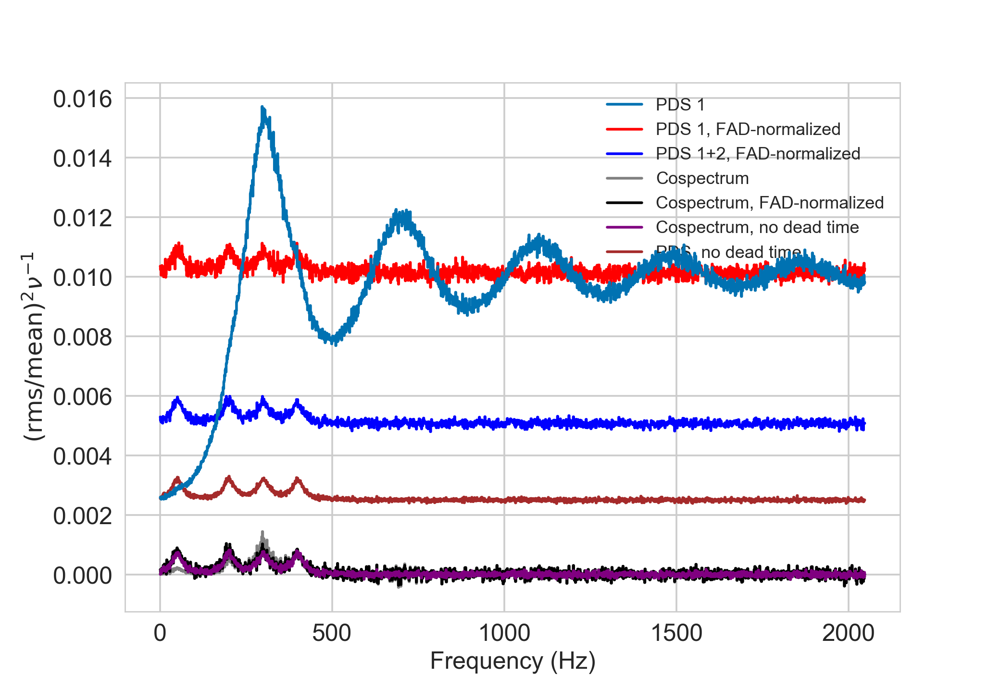

In [8]:
fig = plot_spectrum(label, rebin_factor=1., show=True, subtract_mean=False)



Here we fit this model to the data and we calculate the rms

<IPython.core.display.Javascript object>


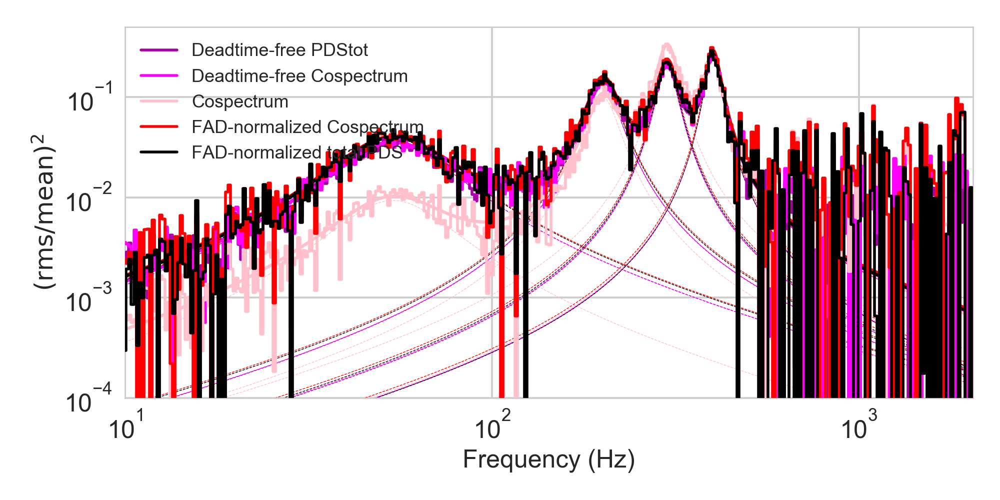

Estimated: 197.703369141 390.91776922 Ratio: 1.97729442305
Real:  197.703369141 399.900146484 Ratio: 2.0227280305
Measured frac. rms from clean spectrum: 39.56%
Measured frac. rms from fad-corrected cs: 41.78%
Measured frac. rms from fad-corrected total pds: 40.73%
Measured frac. rms from fad-corrected single pds: 40.09%
Measured frac. rms from deadtime-affected cs: 38.17%
rms gain expected from incident/detected ratio: 1.98
rms gain cs_norm/cs_dt: 1.09 (correct to -44.6%)
rms gain pds_norm/cs_dt: 1.05 (correct to -46.9%)
rms gain pds_clean/cs_dt: 1.03 (correct to -47.8%)
rms gain pdstot_norm/cs_dt: 1.07 (correct to -46.0%)


In [10]:
res = fit_model_to_all_data(label, model_highfreq, fit_ref='cs')

In [11]:
fig = res['fig']
fig.gca().set_xlim([10, 2048])
fig.gca().set_ylim([1e-4, 0.5])
plt.savefig('four_qpos.eps')

In [12]:
def simulate_and_fit(ctrate, rms=0.8):
    model_highfreq = Lorentz1D(x_0=50, fwhm=40, amplitude=20) + Lorentz1D(x_0=200, fwhm=40, amplitude=20) + Lorentz1D(x_0=300, fwhm=40, amplitude=20) + Lorentz1D(x_0=400, fwhm=40, amplitude=20)
    label, fad_delta = \
        simulate_spectrum(model_highfreq, tstop=512, segment_size=128,
                          smoothing_alg='gauss', rms=rms, mean_ctrate=ctrate,
                          norm='frac')
    res = fit_model_to_all_data(label, model_highfreq, fit_ref='pds')
    cs_model = res['CS_model']
    pdstot_model = res['PDStot_model']
    ref_model = res['ref_model']
    print(model_amp(cs_model[0]), model_amp(ref_model[0]),
          model_amp(cs_model[0]) / model_amp(ref_model[0]))
    print(model_amp(cs_model[1]), model_amp(ref_model[1]),
          model_amp(cs_model[1]) / model_amp(ref_model[1]))
    print(model_amp(cs_model[2]), model_amp(ref_model[2]),
          model_amp(cs_model[2]) / model_amp(ref_model[2]))
    print(model_amp(cs_model[3]), model_amp(ref_model[3]),
          model_amp(cs_model[3]) / model_amp(ref_model[3]))
    print(model_amp(cs_model), model_amp(ref_model),
          model_amp(cs_model) / model_amp(ref_model))
    print(pdstot_model[4].amplitude.value, ref_model[4].amplitude.value,
          (pdstot_model[4].amplitude.value / ref_model[4].amplitude.value))
    print((ctrate/r_det(2.5e-3, ctrate)))
    return res


<IPython.core.display.Javascript object>


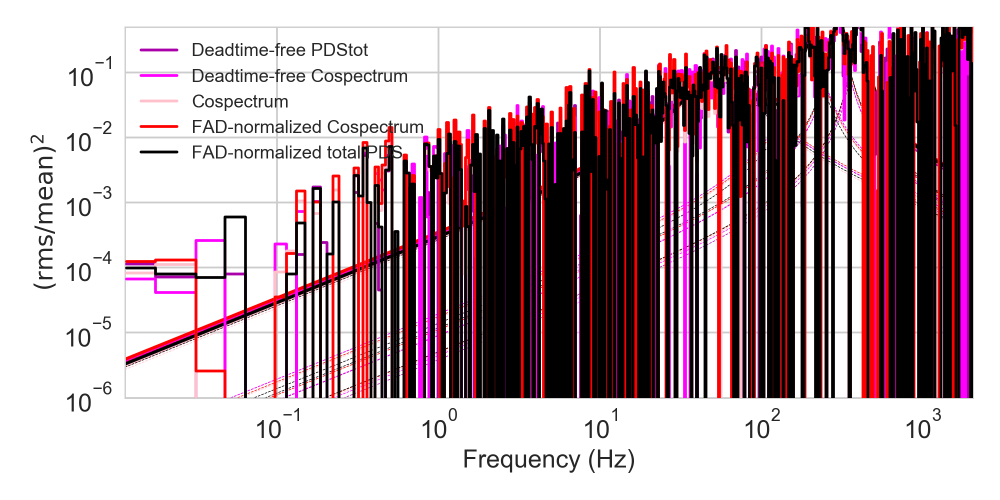

Estimated: 44.419921875 49.9689657635 Ratio: 1.12492241441
Real:  44.419921875 50.1845703125 Ratio: 1.12977619487
Measured frac. rms from clean spectrum: 66.94%
Measured frac. rms from fad-corrected cs: 71.06%
Measured frac. rms from fad-corrected total pds: 68.85%
Measured frac. rms from fad-corrected single pds: 68.79%
Measured frac. rms from deadtime-affected cs: 68.22%
rms gain expected from incident/detected ratio: 1.12
rms gain cs_norm/cs_dt: 1.04 (correct to -7.4%)
rms gain pds_norm/cs_dt: 1.01 (correct to -10.4%)
rms gain pds_clean/cs_dt: 0.98 (correct to -12.8%)
rms gain pdstot_norm/cs_dt: 1.01 (correct to -10.3%)
0.349765802892 0.335777210479 1.04166033899
0.32758371392 0.343200908846 0.954495473282
0.390342618319 0.351649772562 1.11003233551
0.350556560394 0.306400093589 1.14411375104
0.710566301065 0.66938163913 1.06152642906
0.0226930226164 0.0199108198386 1.1397332104
1.125


In [13]:
simulate_and_fit(50);

<IPython.core.display.Javascript object>


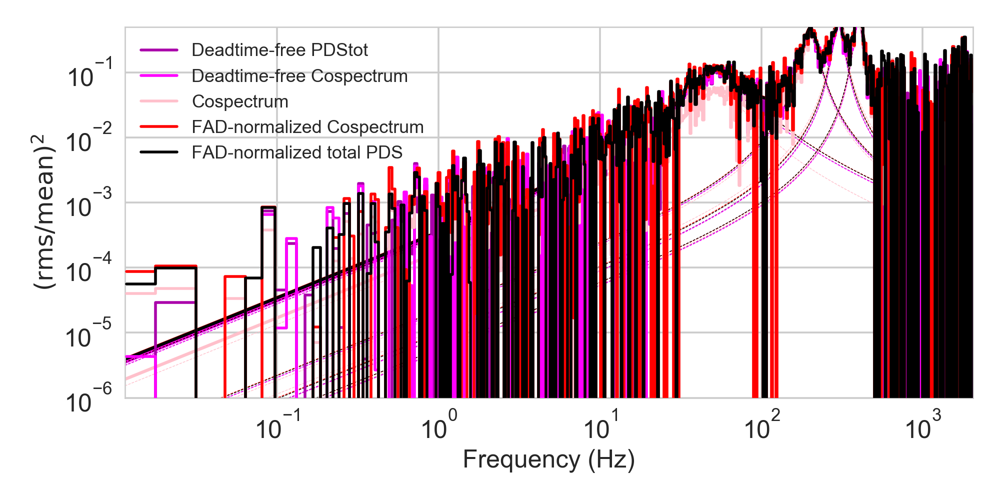

Estimated: 130.103515625 192.819874518 Ratio: 1.48204968629
Real:  130.103515625 200.662109375 Ratio: 1.54232657289
Measured frac. rms from clean spectrum: 69.04%
Measured frac. rms from fad-corrected cs: 72.98%
Measured frac. rms from fad-corrected total pds: 72.54%
Measured frac. rms from fad-corrected single pds: 71.57%
Measured frac. rms from deadtime-affected cs: 67.18%
rms gain expected from incident/detected ratio: 1.48
rms gain cs_norm/cs_dt: 1.09 (correct to -26.7%)
rms gain pds_norm/cs_dt: 1.07 (correct to -28.1%)
rms gain pds_clean/cs_dt: 1.03 (correct to -30.7%)
rms gain pdstot_norm/cs_dt: 1.08 (correct to -27.1%)
0.349954035058 0.331869835559 1.05449184458
0.368225062763 0.354399273273 1.03901190136
0.369692914724 0.340841039412 1.08464906503
0.371310667231 0.353232633528 1.05117883227
0.729795852479 0.690421856684 1.05702889533
0.00770241128076 0.00498637332617 1.54469205913
1.5


In [14]:
simulate_and_fit(200);

<IPython.core.display.Javascript object>


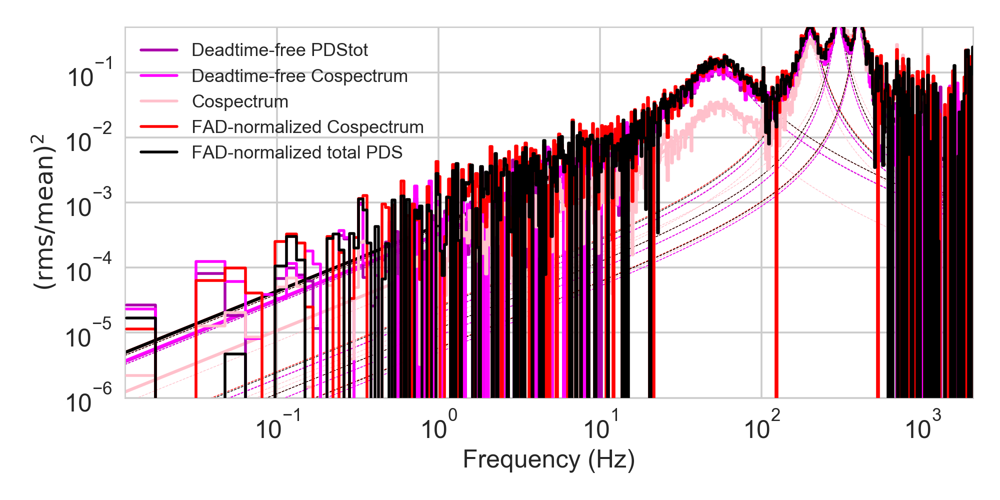

Estimated: 213.8203125 459.384834879 Ratio: 2.1484620872
Real:  213.8203125 499.874023438 Ratio: 2.33782290182
Measured frac. rms from clean spectrum: 68.85%
Measured frac. rms from fad-corrected cs: 78.25%
Measured frac. rms from fad-corrected total pds: 77.63%
Measured frac. rms from fad-corrected single pds: 77.16%
Measured frac. rms from deadtime-affected cs: 67.82%
rms gain expected from incident/detected ratio: 2.15
rms gain cs_norm/cs_dt: 1.15 (correct to -46.3%)
rms gain pds_norm/cs_dt: 1.14 (correct to -47.0%)
rms gain pds_clean/cs_dt: 1.02 (correct to -52.7%)
rms gain pdstot_norm/cs_dt: 1.14 (correct to -46.7%)
0.394341200161 0.335489978697 1.17541871651
0.393145115928 0.344542922915 1.14106281041
0.398399932845 0.349034762641 1.14143339142
0.37889722878 0.347765066658 1.08952067101
0.782530306628 0.688497755012 1.13657640992
0.00470934666962 0.00200176143696 2.35260135532
2.2500000000000004


In [15]:
simulate_and_fit(500);

<IPython.core.display.Javascript object>


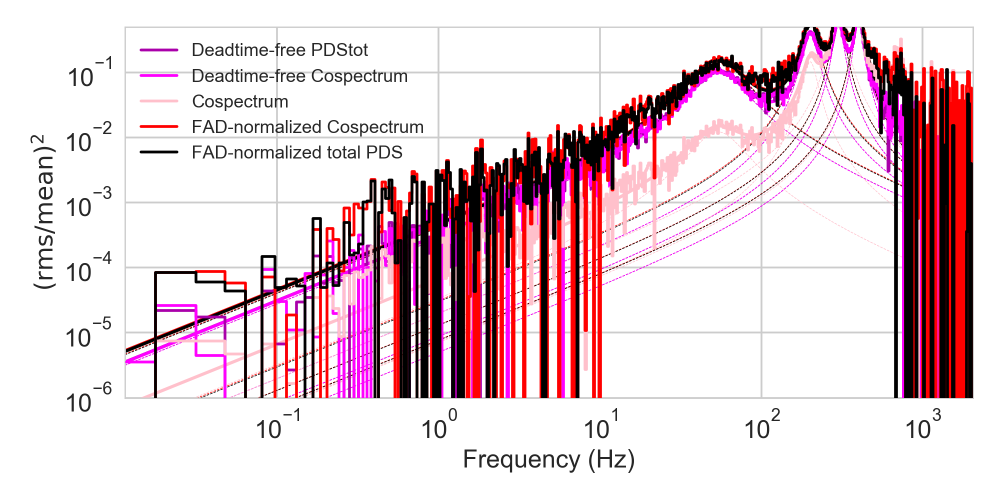

Estimated: 270.56640625 836.155122982 Ratio: 3.09038780745
Real:  270.56640625 999.116210938 Ratio: 3.69268389519
Measured frac. rms from clean spectrum: 68.65%
Measured frac. rms from fad-corrected cs: 84.89%
Measured frac. rms from fad-corrected total pds: 83.89%
Measured frac. rms from fad-corrected single pds: 84.08%
Measured frac. rms from deadtime-affected cs: 70.62%
rms gain expected from incident/detected ratio: 3.09
rms gain cs_norm/cs_dt: 1.20 (correct to -61.1%)
rms gain pds_norm/cs_dt: 1.19 (correct to -61.5%)
rms gain pds_clean/cs_dt: 0.97 (correct to -68.5%)
rms gain pdstot_norm/cs_dt: 1.19 (correct to -61.6%)
0.404530047915 0.332039091718 1.2183205472
0.434034640063 0.345839455362 1.25501770643
0.424307373792 0.345977358805 1.22640214162
0.434312484126 0.348885120947 1.24485814398
0.848937400379 0.686495482679 1.23662488945
0.00374298601106 0.00100446717626 3.72633979439
3.5


In [16]:
simulate_and_fit(1000);

<IPython.core.display.Javascript object>


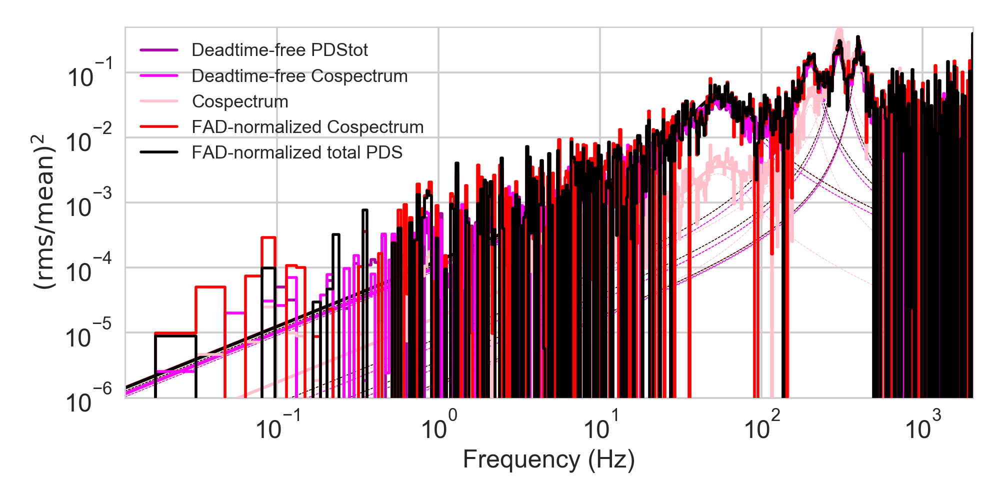

Estimated: 280.798828125 942.268683128 Ratio: 3.35567170782
Real:  280.798828125 998.413085938 Ratio: 3.55561699671
Measured frac. rms from clean spectrum: 39.24%
Measured frac. rms from fad-corrected cs: 43.06%
Measured frac. rms from fad-corrected total pds: 43.01%
Measured frac. rms from fad-corrected single pds: 42.80%
Measured frac. rms from deadtime-affected cs: 38.08%
rms gain expected from incident/detected ratio: 3.36
rms gain cs_norm/cs_dt: 1.13 (correct to -66.3%)
rms gain pds_norm/cs_dt: 1.12 (correct to -66.5%)
rms gain pds_clean/cs_dt: 1.03 (correct to -69.3%)
rms gain pdstot_norm/cs_dt: 1.13 (correct to -66.3%)
0.210642188408 0.189351399295 1.112440622
0.223254222438 0.198204972047 1.12638053492
0.222091238148 0.200462440115 1.1078945164
0.204666987842 0.196640202452 1.04081965585
0.430610814249 0.392417790724 1.09732745158
0.00356987029312 0.00100215687297 3.56218710801
3.5


In [17]:
simulate_and_fit(1000, rms=0.4);

For these very high fractional rmss, the FAD seems to _overcorrect_! However, the peculiar thing here is that the overcorrection does not seem to be as frequency-dependent as the distortion of the deadtime-affected cospectra. See how the non-FAD cospectrum sees the Lorentzians, while the FAD spectra maintain more or less the same ratio between the Lorentzians wrt the clean spectra.
Also, the effect is pronounced only at very high count rates and rms.

<IPython.core.display.Javascript object>


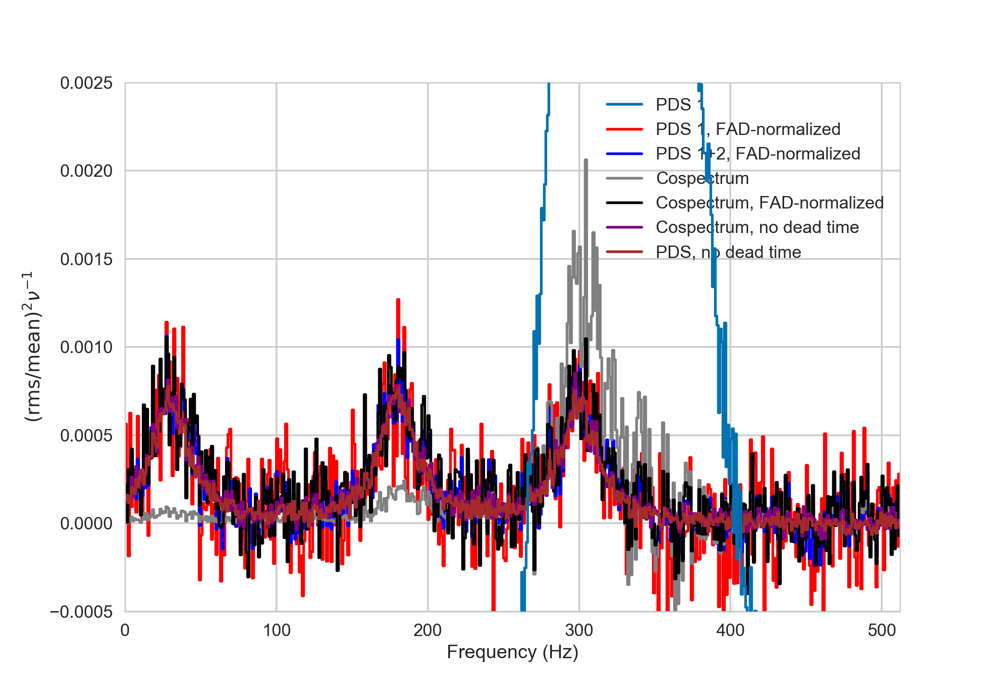

In [21]:
model_highfreq = Lorentz1D(x_0=180, fwhm=30, amplitude=20) + \
    Lorentz1D(x_0=30, fwhm=30, amplitude=20) + \
    Lorentz1D(x_0=300, fwhm=30, amplitude=20)

label, fad_delta = \
    simulate_spectrum(model_highfreq, tstop=1024, segment_size=128, 
                      smoothing_alg='gauss', rms=0.3, mean_ctrate=1000,
                      norm='frac')
fig = plot_spectrum(label, rebin_factor=1., xlim=[0, 512], ylim=[-0.0005, 0.0025], show=True, subtract_mean=True)\


## And now, some statistics.

We now simulate tons of event lists, apply dead time filters, create clean and deadtime-affected light curves,, calculate their FAD-corrected periodograms, and for each we compare the results to the periodograms obtained from the deadtime-free light curves.
All parameters vary freely: count rate, rms, ratio of the flux in the two channels, frequency of the features, their fwhm, etc.

In [18]:
def map_fad_gain_with_channel_ratio(N, table_file=None,
                                    smoothing_alg='gauss', fit_ref='pds'):
    try:
        table = Table.read(table_file)
    except:
        table = Table(names=('frequency,input_rms,input_fwhm,channel_ratio,incident_rate,length,'
                             'segment size,fit_ref,flux_correction,smoothing,'
                             'smoothing length,fad_delta,Frac_rms,delta clean,CS,PDS 1,PDStot,'
                             'slope,median,clean_median').split(','),
                      dtype=[float,float, float, float, float, float, float, 'S6', bool, 'S6',
                             float, float, float, float, float, float, float, float, float, float])
    model = Lorentz1D(x_0=200, fwhm=20, amplitude=20)
    for i in range(N):
        channel_ratio = np.random.uniform(0.7, 1.3)
        mean_ctrate = np.random.uniform(10, 800)
        length = np.random.choice(2**np.arange(9, 10))
        segment_size = np.random.choice(2**np.arange(6, 9))
        if segment_size >= length:
            continue
        rms = np.random.uniform(0.05, 0.5)
        smoothing_length = np.random.randint(5, 7) * segment_size.astype(np.int64)
        frequency = np.random.uniform(10, 600)
        model.x_0 = frequency
        fwhm=np.random.uniform(5, 40)
        model.fwhm = fwhm

        label, fad_delta = \
            simulate_spectrum(model, tstop=length, segment_size=segment_size,
                              channel_ratio=channel_ratio, rms=rms,
                              smoothing_alg=smoothing_alg,
                              smoothing_length=smoothing_length,
                              mean_ctrate=mean_ctrate)
        slope, intercept, intercept_clean = \
            fit_gain_simultaneous(label, rebin_factor=1., return_clean=True)

        deltas = fit_model_to_all_data(label, model, plot=False,
                                       print_results=False, fmin=0, fmax=2048,
                                       fit_ref=fit_ref)

        table.add_row([frequency, rms, fwhm, channel_ratio, mean_ctrate, length,
                       segment_size, fit_ref, False, smoothing_alg,
                       smoothing_length, fad_delta,
                       deltas['Frac_rms'], deltas['delta clean'],
                       deltas['CS'], deltas['PDS'], deltas['PDStot'],
                       slope, intercept, intercept_clean])

        for file in glob.glob(label + '*.nc'):
            os.unlink(file)
            pdsdir = file.replace('.nc', '')
            if os.path.exists(pdsdir) and os.path.isdir(pdsdir):
                shutil.rmtree(pdsdir)

    if table_file is not None:
        table.write(table_file,overwrite=True)
    return table


In [63]:
# benchmark
# %prun -D profile_spline.prof map_fad_gain_with_channel_ratio(model, 1, table_file='results.csv', smoothing_alg='spline')


In [65]:
# %prun -D profile_gauss.prof map_fad_gain_with_channel_ratio(1, table_file='results_allfreq.csv', smoothing_alg='gauss')

 
*** Profile stats marshalled to file 'profile_gauss.prof'. 


In [66]:
# !snakeviz profile_gauss.prof

In [99]:
count = 0
errcount = 0

for i in range(1000):
    try:
        results = map_fad_gain_with_channel_ratio(1, table_file='results_allfreq.csv',
                                                  smoothing_alg='gauss', fit_ref='cs')
        count += 1
        print('Realization n. {} completed'.format(count), end='\r')
    except KeyboardInterrupt:
        print('Ok. (after {} realizations)'.format(count))
        break
    except Exception as e:
        with open('err.log', 'a') as errlog:
            print(str(e), file=errlog)
        if errcount > 10:
            break
        errcount += 1


Having saved the results of each realization in the file results_allfreq.csv, we can now make some plots to look for parameter correlations.
We made multiple runs, concentrating most efforts for channel ratios < 30% of each others.

Below, one can see how the relative difference between the rms measured from the FAD-corrected periodograms and that measured from the deadtime-free spectra behaves.
The distribution would be around zero if there were no differences, on average, between the values measured with the various methods.

<IPython.core.display.Javascript object>


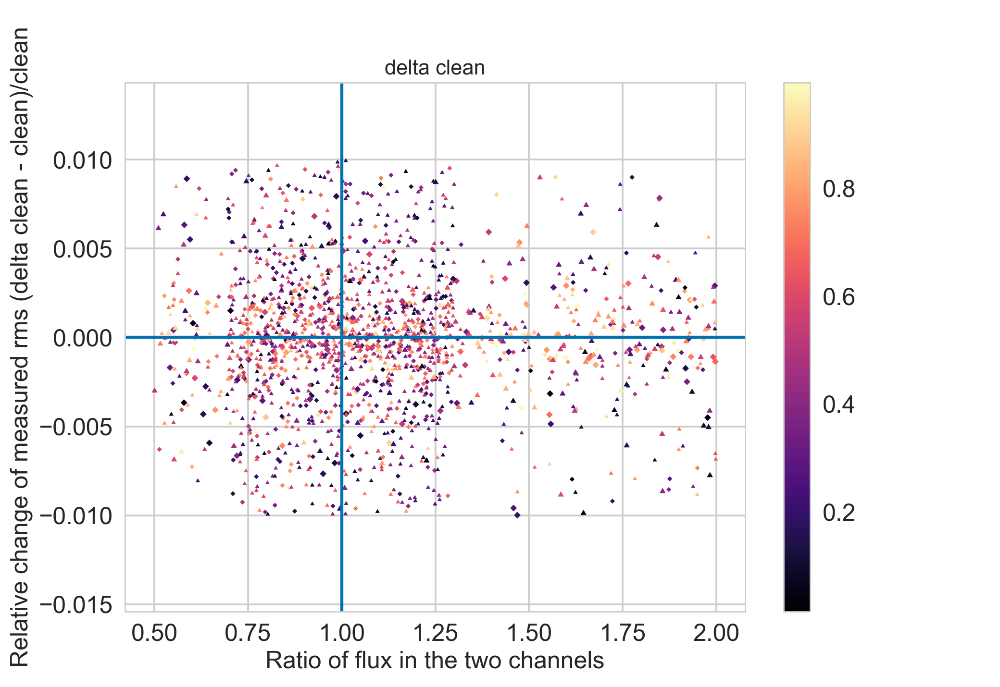

<IPython.core.display.Javascript object>


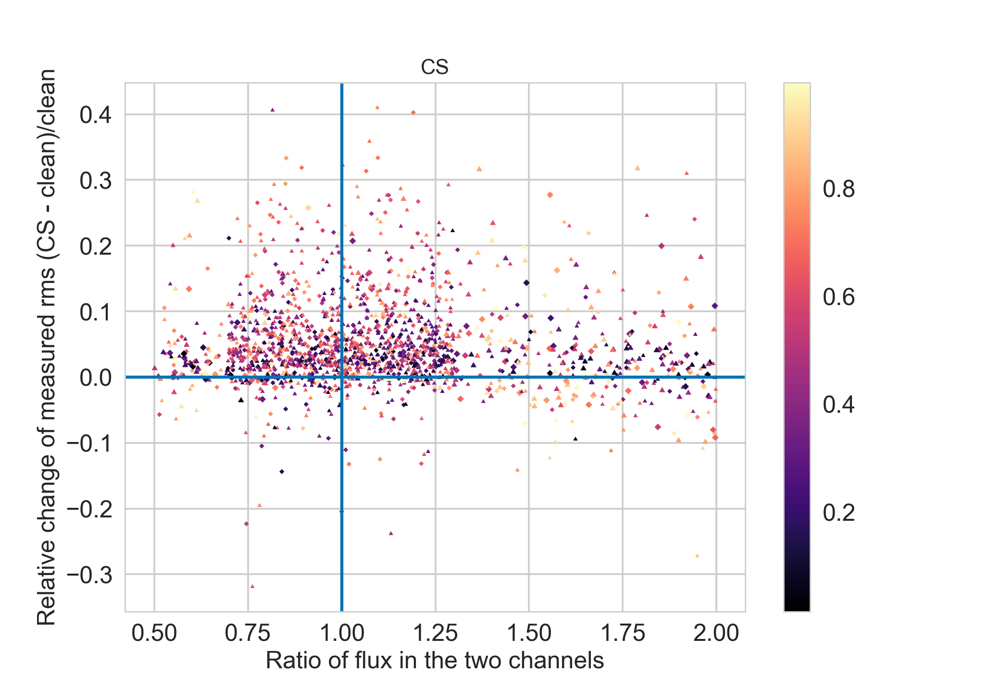

<IPython.core.display.Javascript object>


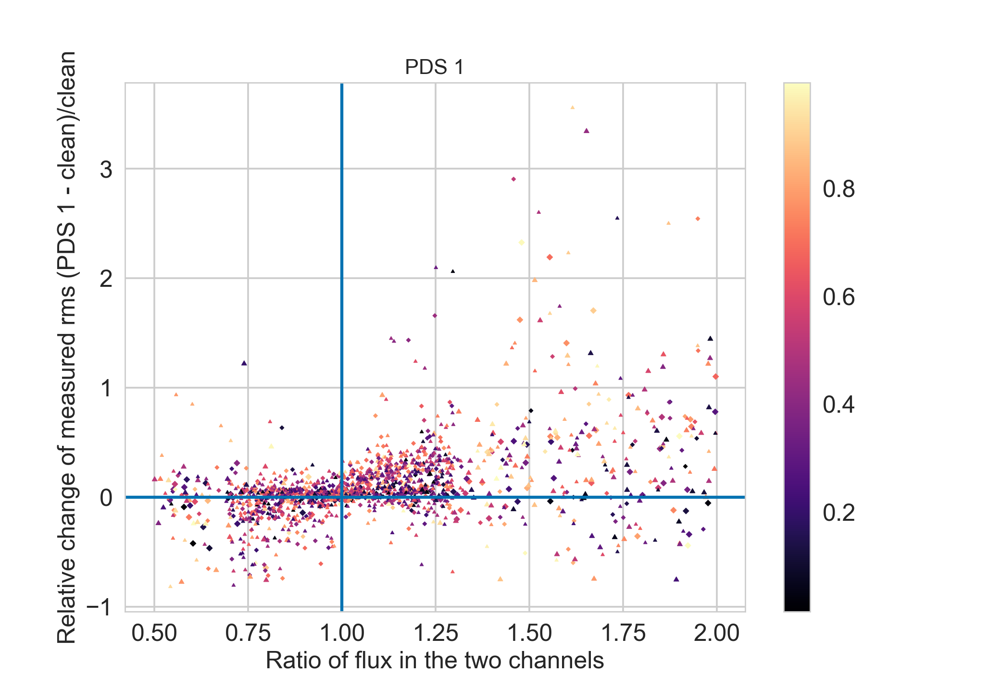

<IPython.core.display.Javascript object>


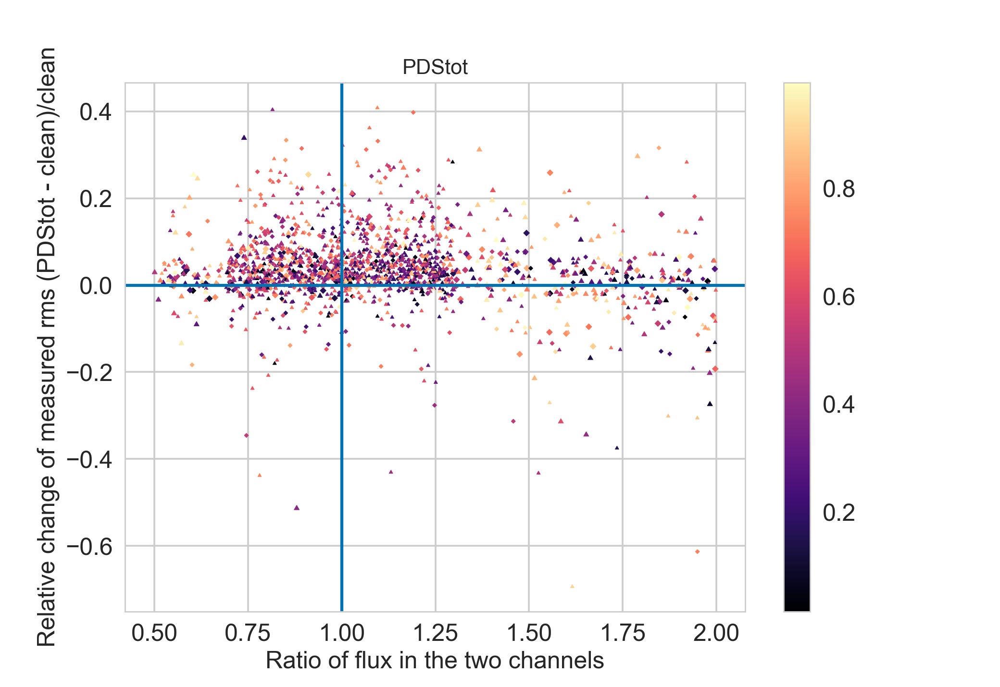

In [19]:
plot_all('results_allfreq.csv')

Interesting to see how only the single-channel periodogram is really heavily affected by the ratio of the flux in the two channels, while both the total-intensity periodogram and the cospectrum have practically the same distribution of errors with flux ratios about down to 0.75%.

Also interesting to see how the distribution of errors is skewed towards an overestimation of the rms. This was seen already above in one of the multiple-QPO examples, it is even more evident here.

Below, we plot most variables versus each other.

<IPython.core.display.Javascript object>


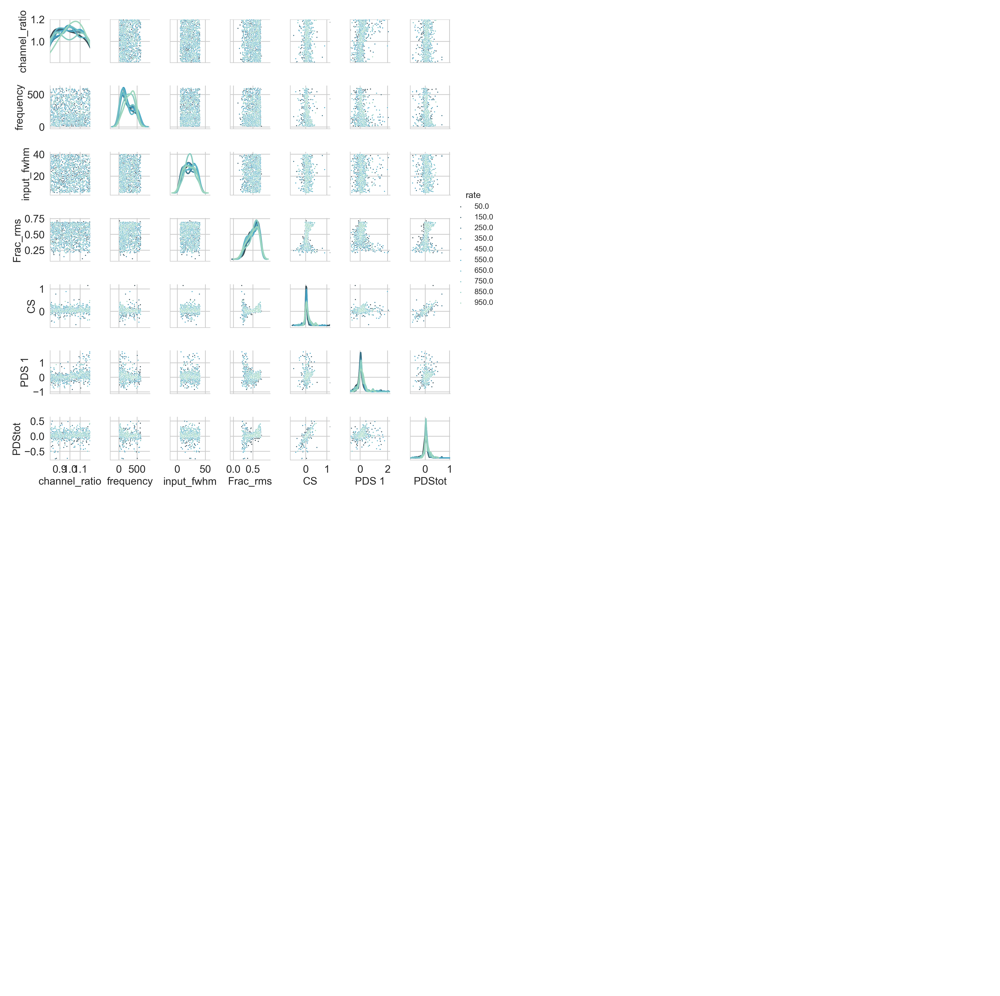

In [21]:
_=pairplot('results_allfreq.csv')


In [22]:
table = read_csv('results_allfreq.csv')
table

,frequency,input_rms,input_fwhm,channel_ratio,incident_rate,length,segment size,fit_ref,flux_correction,smoothing,smoothing length,fad_delta,Frac_rms,delta clean,CS,PDS 1,PDStot,slope,median,clean_median
0,436.574312,0.443898,9.594798,1.213008,596.054311,512.0,256.0,pds,False,gauss,1536.0,-0.001141,0.657107,0.000590,0.069556,0.085095,0.068307,1.139532,0.004066,0.001525
1,478.769503,0.471725,12.549679,1.445555,238.535104,1024.0,256.0,cs,False,gauss,1536.0,0.000012,0.671746,-0.000811,0.040334,0.073967,0.036364,1.078259,0.006043,0.003431
2,352.956323,0.378754,19.156952,1.572632,973.607383,512.0,128.0,cs,False,gauss,640.0,-0.000565,0.610969,-0.000998,-0.065864,-0.576935,-0.052986,0.871953,0.003290,0.000806
3,485.945988,0.131428,27.437073,1.712664,534.675432,1024.0,128.0,cs,False,gauss,768.0,0.001202,0.353884,-0.018630,-0.022202,0.857608,-0.056839,1.001390,0.003930,0.001381
4,426.436712,0.254242,10.636288,1.801817,313.149847,1024.0,256.0,cs,False,gauss,1280.0,-0.000172,0.502036,0.000555,-0.008025,0.018227,-0.003563,0.986553,0.004869,0.002283
5,366.974064,0.373602,7.296775,1.186811,769.379892,512.0,256.0,cs,False,gauss,1280.0,-0.000306,0.607160,-0.000819,-0.015876,-0.070737,-0.014143,0.967846,0.003670,0.001194
6,119.489199,0.182288,36.014268,0.600565,837.509529,512.0,256.0,cs,False,gauss,1280.0,0.000371,0.426667,-0.007265,0.009559,NaN,-0.183294,0.895148,0.004081,0.001498
7,342.129807,0.327277,37.696150,0.745042,783.003330,512.0,256.0,cs,False,gauss,1280.0,0.000283,0.566598,-0.002448,0.001466,0.264081,0.006818,1.007390,0.003950,0.001469
8,209.983407,0.323652,31.449957,1.470362,170.626629,512.0,128.0,cs,False,gauss,640.0,0.000971,0.563388,-0.012128,0.033538,0.211039,0.033423,1.019170,0.007352,0.004757
9,414.338463,0.400066,26.472810,1.164103,447.116833,512.0,256.0,cs,False,gauss,1280.0,-0.000285,0.626236,0.001446,0.034581,0.044417,0.037567,1.055304,0.004619,0.002086


In [71]:
stats('results_allfreq.csv')

CS:
Mean _relative_ shift ((CS - clean)/clean) = (5.6 +- 7.6)%
PDStot:
Mean _relative_ shift ((PDStot - clean)/clean) = (3.9 +- 9.8)%
PDS 1:
Mean _relative_ shift ((PDS 1 - clean)/clean) = (17.8 +- 46.1)%


And below, we can see how the overestimation is strongly dependent on count rate, rms, and frequency.

Low frequencies:

<IPython.core.display.Javascript object>


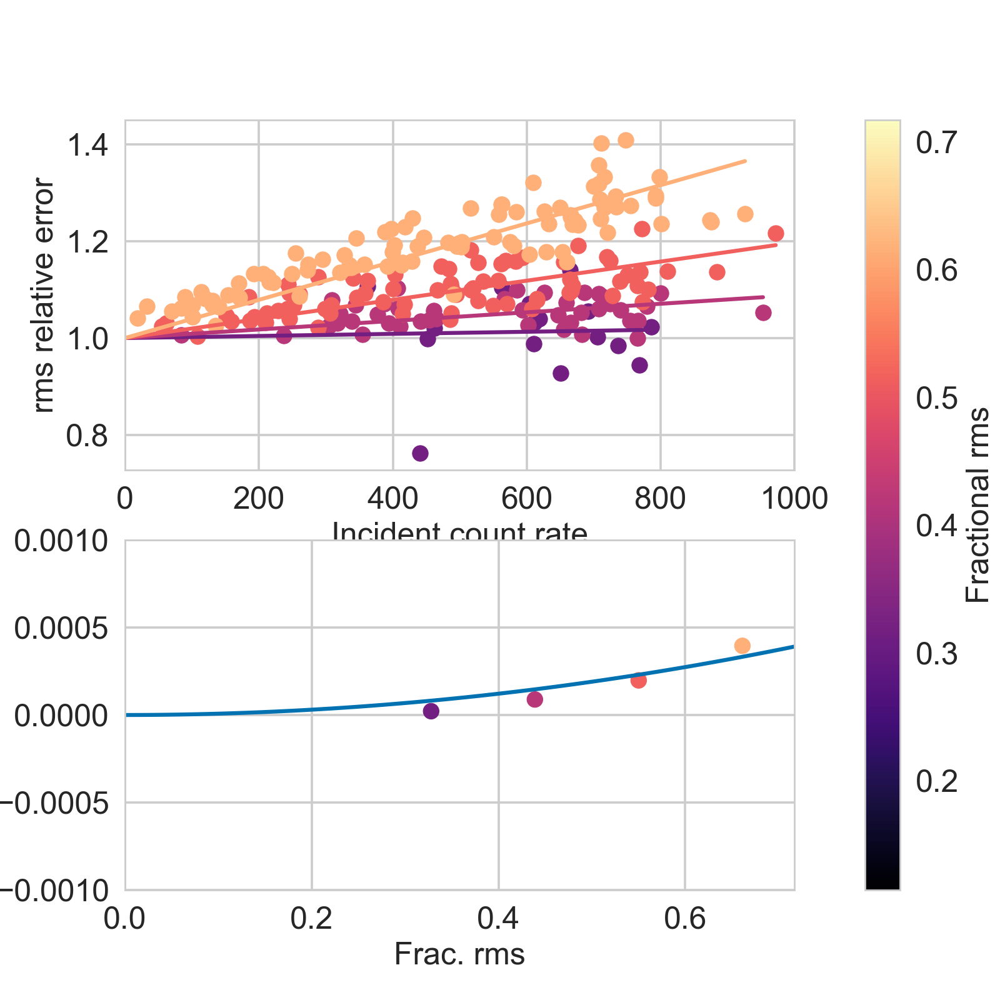

0.000760694758574


In [23]:
fit_incident_vs_delta('results_allfreq.csv', 
                      filters={'channel_ratio': [0.8, 1.2], 'frequency': [0,100]}, nsub=7)

Slightly higher frequencies:

<IPython.core.display.Javascript object>


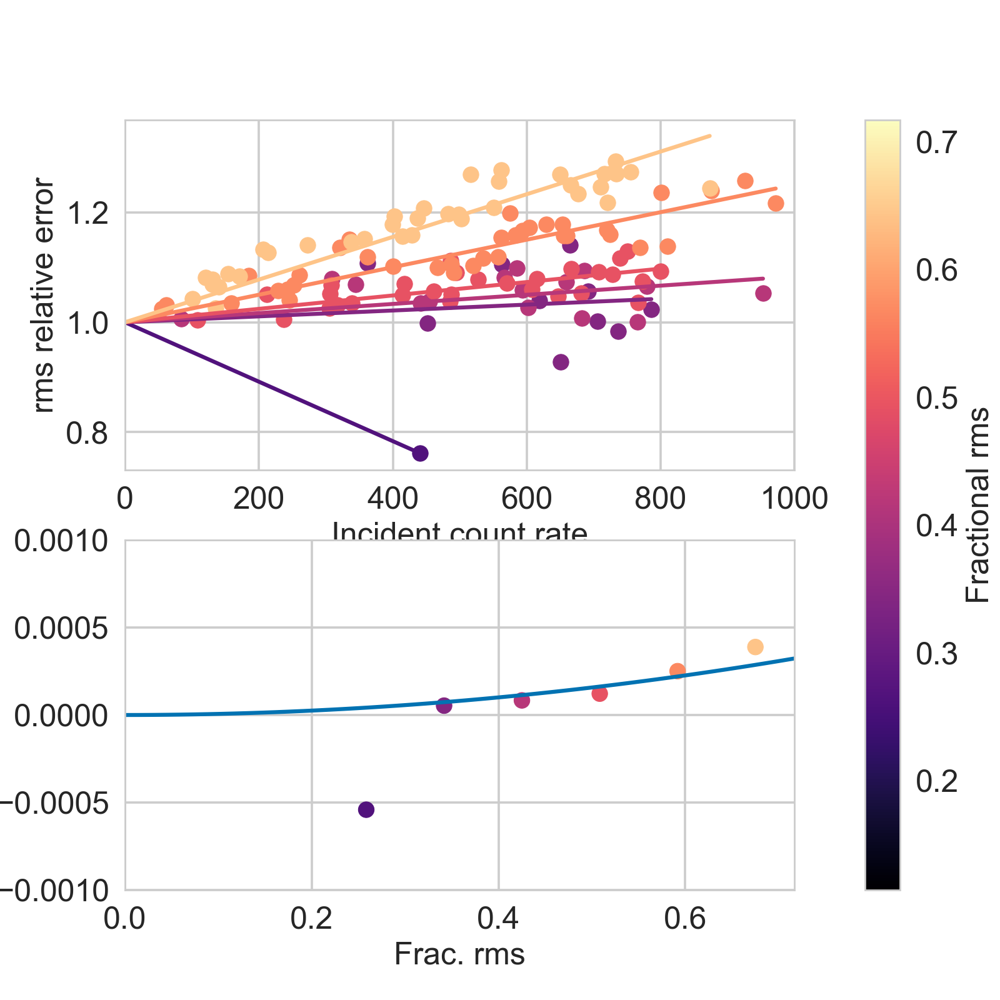

0.000628593831092


In [24]:
fit_incident_vs_delta('results_allfreq.csv', 
                      filters={'channel_ratio': [0.8, 1.2], 'frequency': [50,100]})

Even higher:

<IPython.core.display.Javascript object>


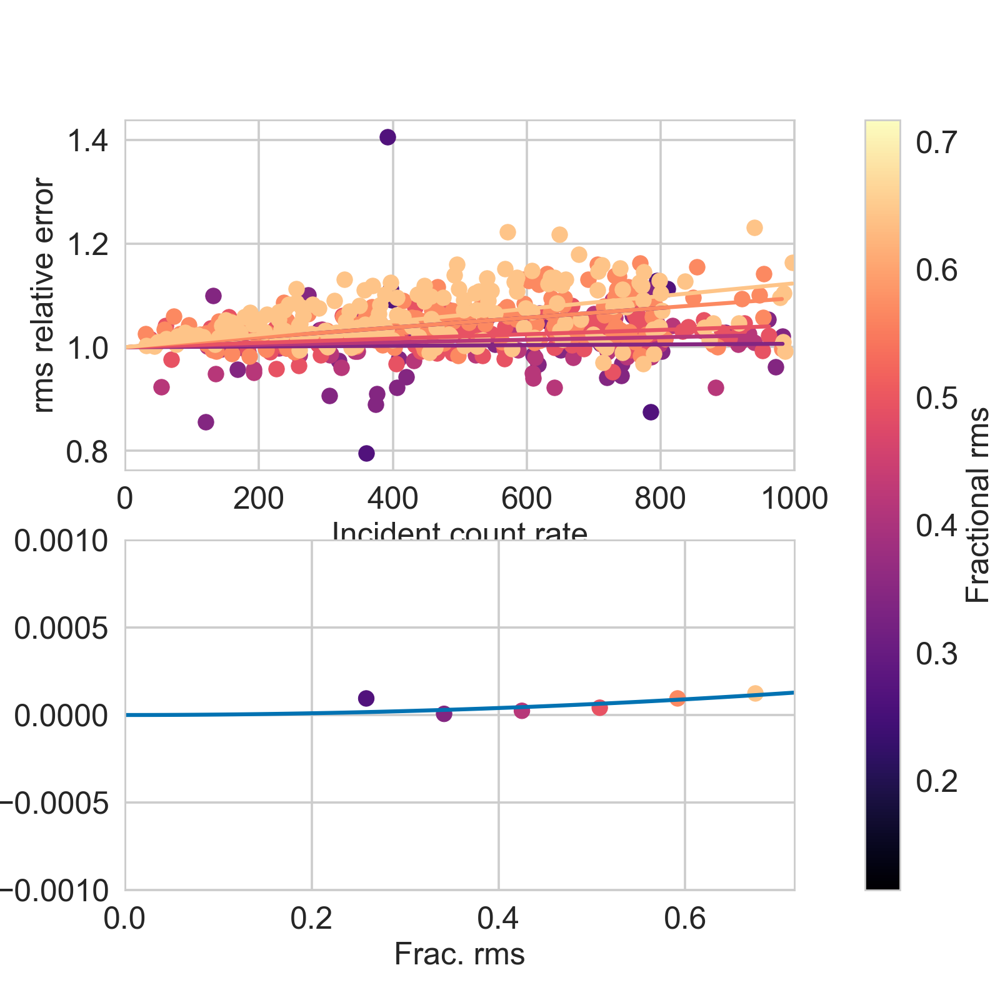

0.000249012682434


In [25]:
fit_incident_vs_delta('results_allfreq.csv', 
                      filters={'channel_ratio': [0.8, 1.2], 
                               'frequency': [100,500]})